In [0]:
!pip install -U sklearn
!pip install -U numpy
!pip install -U matplotlib
!pip install -U plotly

In [0]:
import numpy as np
import time
from sklearn.datasets.samples_generator import make_blobs

# Visualization
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
from matplotlib import animation, rc
from IPython.display import HTML


In [0]:
def measure_score(W, x, y):
    """
    INPUT: 
    w: vector
    x, y: scalar
    RETURN:
    loss: scalar
    """
    # Sign
    sgn = np.ones(W.shape[0]) 
    sgn[y, ] = -1 
    S_ns =  W * x # element multiplication
    return (S_ns.T*sgn).T
    

def hinge_loss(W, X, y):
    loss_list = []
    # When X is a vector and y is a scala
    if y.size == 1:
        S = measure_score(W, X, y)
        return [max(0, np.sum(S))]
        
    for i in range(0, y.shape[0]):
        S = measure_score(W, X[i], y[i])
        loss_list.append(max(0, np.sum(S)))
    return loss_list


In [0]:
def svm_gradient_descent(W, X, y, lr = 10e-7, epochs=200, min_diff=10e-4):
    """
    W: matrix (k x d)
    X: matrix (n x d)
    y: vector (n x 1)
    lr: learning rate
    epochs: iterations
    min_diff: minimum different between two loss
    """
    weight = W # init weight
    loss_list = hinge_loss(weight, X, y)
    weights = {sum(loss_list): weight}
    total_dw = np.zeros(W.shape)
    
    epoch = 0
    # When y is a vector
    if y.size > 1:
        while epoch < epochs:
            epoch += 1

            for i in range(y.shape[0]):
                # When loss at X[i] > 0
                if loss_list[i] > 0:
                    # Numerical Gradient Descent
                    dw = (measure_score(weight+10e-6, X[i], y[i])  - measure_score(weight-10e-6, X[i], y[i]))/(2*10e-6) 
                    total_dw += dw

            weight = - (1/X.shape[0])*lr*total_dw # update weight
            loss_list = hinge_loss(weight, X, y)
            weights[sum(loss_list)] = weight

        S = []

        for i in range(y.shape[0]):
            S.append(measure_score(weights[min(weights.keys())], X[i], y[i]))
    # When y is a scalar
    else:
        while epoch < epochs:
            epoch += 1
            if loss_list[0] > 0:
                # Numerical Gradient Descent
                dw = (measure_score(weight+10e-6, X, y)  - measure_score(weight-10e-6, X, y))/(2*10e-6) 
                total_dw += dw

            weight = - (1/X.shape[0])*lr*total_dw # update weight
            loss_list = hinge_loss(weight, X, y)
            weights[sum(loss_list)] = weight

        S = measure_score(weights[min(weights.keys())], X, y)
    return weights, S


'''SVM Stochastic Gradient Descent''' 
def svm_stochastic_gradient_descent(w, X, y, size=60, lr=10e-4, C=1, epochs=5):
    epoch_num = 0
    loss = np.sum(hinge_loss(w, X, y))
    weights = {loss: w}  # list weights 
    last_weight = w  # init weight
    
    while epoch_num < epochs:
        epoch_num += 1
        
        # get record randomly (without replacement)
        positions = np.random.choice(range(X.shape[0]), size=size, replace=False) 
        current_weight = np.zeros(w.shape) # Total weight of a epoch
        
        # Loop throught some row as a dataset
        for position in positions:
            weights_epoch, S = svm_gradient_descent(last_weight, X[position], y[position])
            current_weight += weights_epoch[min(weights_epoch.keys())]
            
        current_weight /= size
        loss_epoch = sum(hinge_loss(current_weight, X, y))    
        weights[loss_epoch] = current_weight 
        last_weight = current_weight  # Prepare for next epoch
    
    return weights

In [0]:
# FIND X
def compute_x1(w, x2):
    return (-w[1] * x2 - w[2])/w[0]

def compute_x3(w, x1, x2):
    return (-w[0] * x1 - w[1] * x2 - w[3])/w[2]


# Animating function for plotly
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

# 2 Dimensions

In [0]:
centers = [(30, 30), (-10, 0), (25, -15)]
cluster_std = [10, 8, 10]

X, y = make_blobs(n_samples=3000, cluster_std=cluster_std, centers=centers, n_features=2, random_state=1)
X -= np.mean(X)
X = np.append(X, np.ones((X.shape[0], 1)), axis = 1) # add bias at last

W = np.zeros((len(np.unique(y)), X.shape[1])) + 0.01 # add bias at last (column vector)

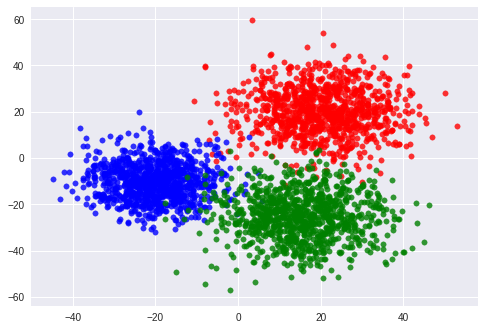

In [6]:
plt.scatter(X[y == 0, 0], X[y == 0, 1], color="red", s=30, label="Cluster1", alpha=0.8)
plt.scatter(X[y == 1, 0], X[y == 1, 1], color="blue", s=30, label="Cluster2", alpha=0.8)
plt.scatter(X[y == 2, 0], X[y == 2, 1], color="green", s=30, label="Cluster3", alpha=0.8)

## Processing

### Gradient Descent

In [61]:
start_time_gd = time.time()
weights_gd, S_gd = svm_gradient_descent(W, X, y, epochs=100)
end_time_gd = time.time()

print (min(weights_gd.keys()), end_time_gd - start_time_gd)

0.0003697802685973475 4.461899280548096


### Stochastic Gradient Descent

In [62]:
start_time_sgd = time.time()
weights_sgd = svm_stochastic_gradient_descent(W, X, y, epochs=1, size=1000)
end_time_sgd = time.time()

print (min(weights_sgd.keys()), end_time_sgd - start_time_sgd)

0.00016982149550595792 3.358307361602783


## Visualization

### Results

In [0]:
# measure skip value
skip_range = int(len(weights_gd.keys())/70) # skip first and last
loss_list = []
for i in range(len(weights_gd.keys())):
    if i%skip_range == 0:
        loss_list.append(list(weights_gd.keys())[i])

# add min loss to loss_list
if (len(weights_gd.keys())-1)%70 != 0:
    loss_list.append(min(weights_gd.keys()))

In [0]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,7))
                                                                                            
# LEFT CHART
ax[0].plot(loss_list)
# Moving point initiation
point, = ax[0].plot(0,0, 'ro')
point.set_data([],[])


def init_loss_point():
    ax[0].set_xlabel('$No. Epoch$')
    ax[0].set_ylabel('$Loss$')
    point.set_data(min(loss_list), max(loss_list))
    return point
    
    
def animate_loss_point(i):
    point.set_data(i,loss_list[i])
    return point


# RIGHT CHART
ax[1].plot(X[y == 0, 0], X[y == 0, 1], 'ro', alpha=0.8)
ax[1].plot(X[y == 1, 0], X[y == 1, 1], 'go', alpha=0.8)
ax[1].plot(X[y == 2, 0], X[y == 2, 1], 'bo', alpha=0.8)
ax[1].set_xlabel('$x_1$')
ax[1].set_ylabel('$x_2$')

# get and set bound of chart
x2_min, x2_max = ax[1].get_ybound() 
x1_min, x1_max = ax[1].get_xbound()
ax[1].set_ylim((x2_min, x2_max))
ax[1].set_xlim((x1_min, x1_max))

line = {}
line['r'], = ax[1].plot([0, 0], [0, 0], color='black', lw=5.0, alpha=0.5)
line['g'], = ax[1].plot([0, 0], [0, 0], color='black', lw=5.0, alpha=0.5)
line['b'], = ax[1].plot([0, 0], [0, 0], color='black', lw=5.0, alpha=0.5)


def init_line():
    x1_min = compute_x1(weights_gd[max(loss_list)][0], x2_min)
    x1_max = compute_x1(weights_gd[max(loss_list)][0], x2_max)
    ax[1].plot([x1_min, x1_max], [x2_min, x2_max], color='gray', lw=5.0, alpha=0.8)
        
    for weight, color in zip(weights_gd[min(loss_list)], ['r', 'g', 'b']):
        x1_min = compute_x1(weight, x2_min)
        x1_max = compute_x1(weight, x2_max)
        ax[1].plot([x1_min, x1_max], [x2_min, x2_max], color=color, lw=5.0, alpha=0.8)
    return line,
                                                  
            
def animate_line(i):
    for weight, color in zip(weights_gd[loss_list[i]], ['r', 'g', 'b']):
        x1_min = compute_x1(weight, x2_min)
        x1_max = compute_x1(weight, x2_max)
        line[color].set_data([x1_min, x1_max], [x2_min, x2_max])
    return line,


'''MAIN VISUALIZATION'''
def init():
    point = init_loss_point()
    line, = init_line()
    return point, line, 


def animate(i):
    point = animate_loss_point(i)
    line, = animate_line(i)
    return point, line, 
                                                  
plt.close()
rc('animation', html='jshtml')
ani = animation.FuncAnimation(fig, animate, init_func=init, frames=len(loss_list)-1, interval=len(loss_list)-1)
ani

### Compare GD and SGD

Text(0, 0.5, 'Minimum Loss')

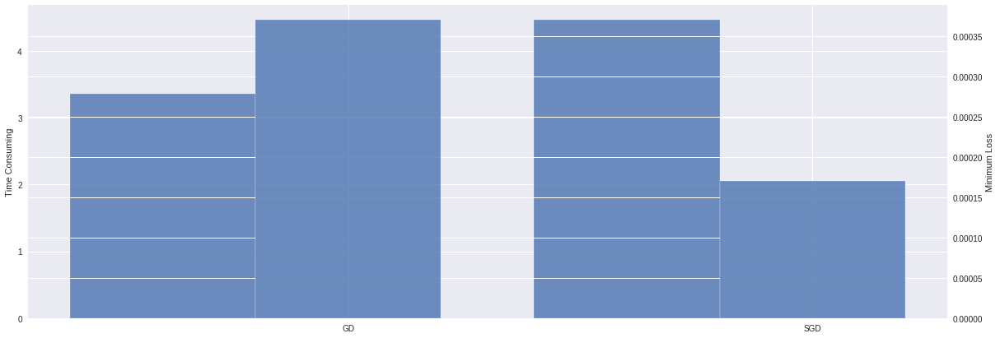

In [90]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(20,7))

methods = ['GD', 'SGD'] 

bar_width = 0.4
r1 = np.arange(len(methods))
r2 = [x + bar_width for x in r1]

# PLOT CHART
ax.bar(r1, [end_time_sgd - start_time_sgd, end_time_gd - start_time_gd], width = bar_width, edgecolor='white', alpha = 0.8, align='center')
ax2 = ax.twinx()
ax2.bar(r2, [min(weights_gd.keys()), min(weights_sgd.keys())], width = bar_width, edgecolor='white', alpha = 0.8, align='center')
# CHANGE AXIS TITLE
plt.xticks([r + bar_width for r in range(len(methods))], methods)
ax.set_ylabel('Time Consuming')
ax2.set_ylabel('Minimum Loss')


# 3 Dimensions

In [0]:
from mpl_toolkits.mplot3d import Axes3D


In [0]:
centers = [(30, 30, 30), (-10, 0, 10), (25, -15, 15)]
cluster_std = [10, 8, 10]

X, y = make_blobs(n_samples=3000, cluster_std=cluster_std, centers=centers, n_features=3, random_state=1)
X -= np.mean(X)
X = np.append(X, np.ones((X.shape[0], 1)), axis = 1) # add bias at last

W = np.zeros((len(np.unique(y)), X.shape[1])) + 0.01 # add bias at last (column vector)

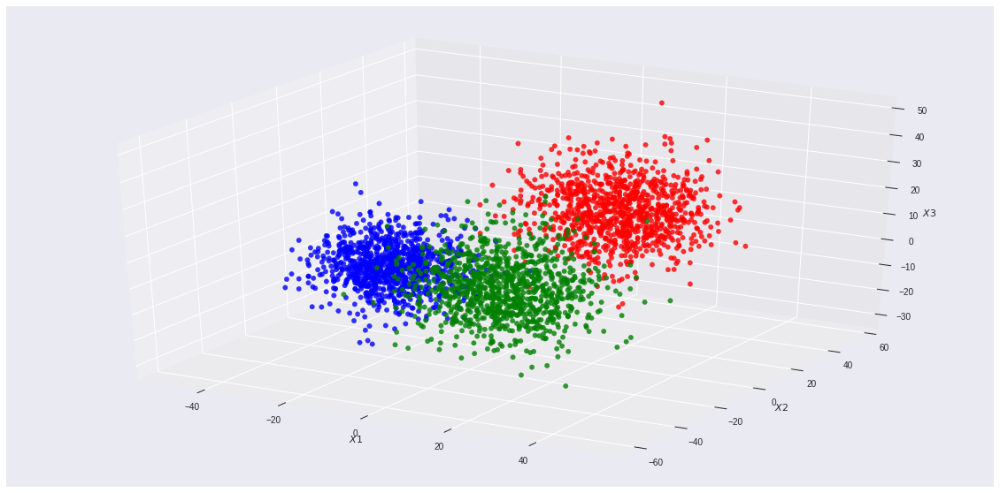

In [158]:
fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(X[y == 0, 0], X[y == 0, 1], X[y == 0, 2], color="red", s=30, label="Cluster1", alpha=0.8)
ax.scatter(X[y == 1, 0], X[y == 1, 1], X[y == 1, 2], color="blue", s=30, label="Cluster2", alpha=0.8)
ax.scatter(X[y == 2, 0], X[y == 2, 1], X[y == 2, 2], color="green", s=30, label="Cluster3", alpha=0.8)

ax.set_xlabel('$X1$')
ax.set_ylabel('$X2$')
ax.set_zlabel('$X3$')

x3_min, x3_max = ax.get_zbound() 
x2_min, x2_max = ax.get_ybound() 
x1_min, x1_max = ax.get_xbound()

## Processing

### Gradient Descent

In [129]:
start_time_gd = time.time()
weights_gd, S_gd = svm_gradient_descent(W, X, y, epochs=100)
end_time_gd = time.time()

print (min(weights_gd.keys()), end_time_gd - start_time_gd)

0.00026793337914658575 4.443981647491455


### Stochastic Gradient Descent

In [130]:
start_time_sgd = time.time()
weights_sgd = svm_stochastic_gradient_descent(W, X, y, epochs=1, size=1000)
end_time_sgd = time.time()

print (min(weights_sgd.keys()), end_time_sgd - start_time_sgd)

0.00013687508909598561 3.430429697036743


## Visualization


In [0]:
x1 = np.linspace(x1_min, x1_max, num=50)
x2 = np.linspace(x2_min, x2_max, num=50)

x1, x2 = np.meshgrid(x1, x2)

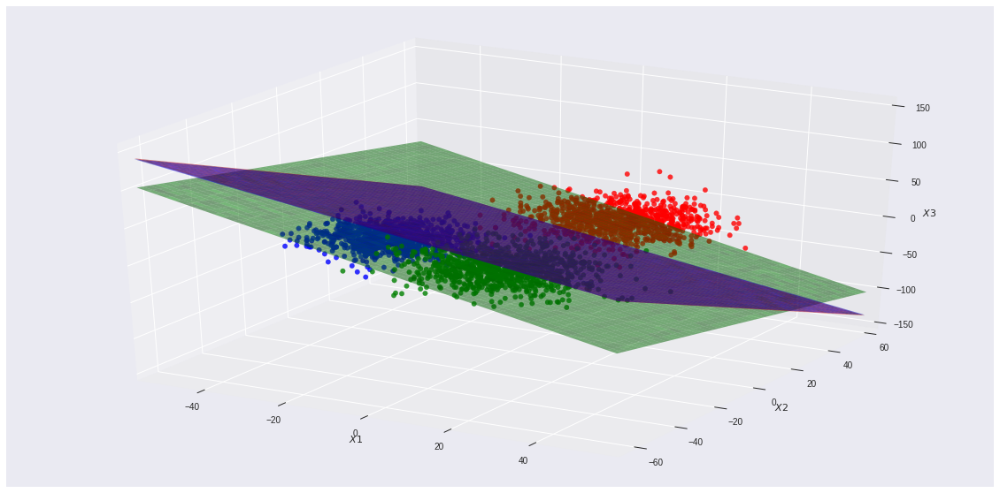

In [165]:
fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(X[y == 0, 0], X[y == 0, 1], X[y == 0, 2], color="red", s=30, label="Cluster1", alpha=0.8)
ax.scatter(X[y == 1, 0], X[y == 1, 1], X[y == 1, 2], color="blue", s=30, label="Cluster2", alpha=0.8)
ax.scatter(X[y == 2, 0], X[y == 2, 1], X[y == 2, 2], color="green", s=30, label="Cluster3", alpha=0.8)

ax.set_xlabel('$X1$')
ax.set_ylabel('$X2$')
ax.set_zlabel('$X3$')

ax.set_xlim(x1_min, x1_max)
ax.set_ylim(x2_min, x2_max)

for weight, color in zip(weights_sgd[min(weights_sgd.keys())], ['r', 'g', 'b']):
    x3 = compute_x3(weight, x1, x2)
    ax.plot_surface(X=x1, Y=x2, Z=compute_x3(weight, x1, x2), color=color, alpha=0.5)
